# Reference dataset

https://github.com/ieee8023/covid-chestxray-dataset



VGG19

VGG16

Xception

Resnet50 v2

Inception V3

Densenet121

Resnet101v2

Resnet 50

Efficientnet B0

# VGG19

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 500
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/3a9c2da0-7cf6-4d51-8012-096f6f4e461e.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8c48a7-3158-4df1-b484-b6f677ff9612.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2c96c09b-aaa8-4c07-8e69-c2210f04be2d.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2a2f58c6-73d5-4e72-82ec-e07daa759544.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

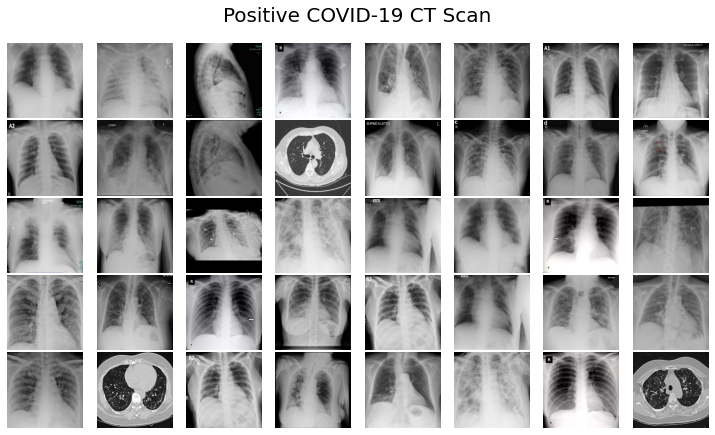

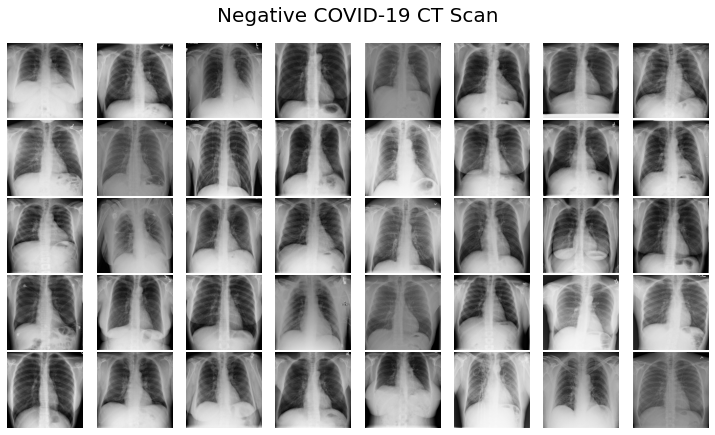

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

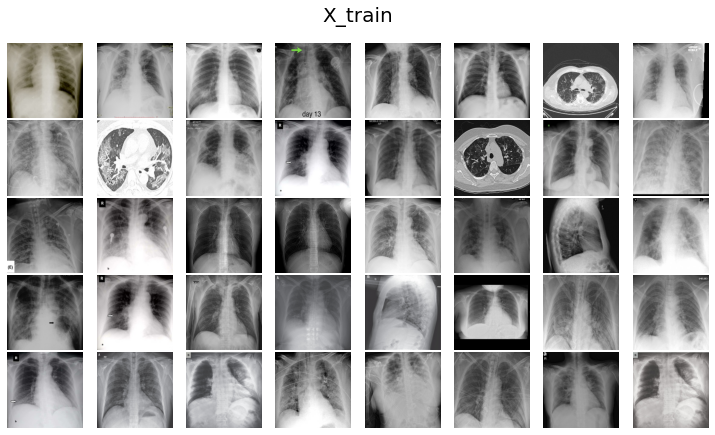

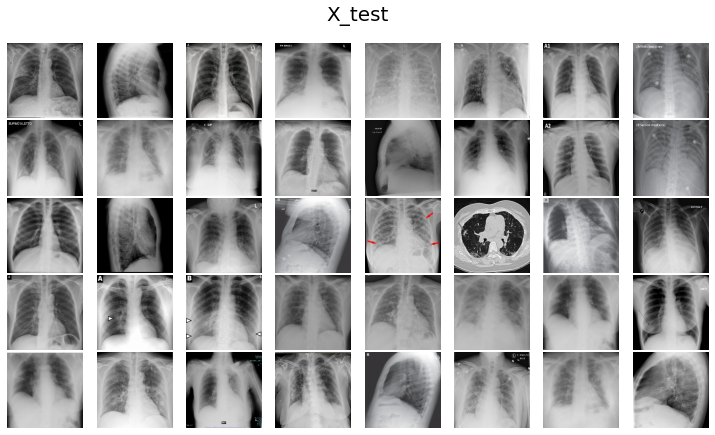

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = VGG19(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

80142336/80134624 [==============================] - 1s 0us/step


In [ ]:
train_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=500)

Epoch 1/500
23/23 [==============================] - 19s 456ms/step - loss: 1.5001 - accuracy: 0.5061 - val_loss: 0.6354 - val_accuracy: 0.6968
Epoch 2/500
23/23 [==============================] - 9s 375ms/step - loss: 0.7157 - accuracy: 0.6566 - val_loss: 0.4160 - val_accuracy: 0.8138
Epoch 3/500
23/23 [==============================] - 9s 376ms/step - loss: 0.6086 - accuracy: 0.7011 - val_loss: 0.5326 - val_accuracy: 0.7606
Epoch 4/500
23/23 [==============================] - 9s 380ms/step - loss: 0.5095 - accuracy: 0.7506 - val_loss: 0.3914 - val_accuracy: 0.8298
Epoch 5/500
23/23 [==============================] - 9s 372ms/step - loss: 0.4957 - accuracy: 0.7713 - val_loss: 0.3309 - val_accuracy: 0.8457
Epoch 6/500
23/23 [==============================] - 9s 375ms/step - loss: 0.4456 - accuracy: 0.7733 - val_loss: 0.3831 - val_accuracy: 0.8351
Epoch 7/500
23/23 [==============================] - 9s 374ms/step - loss: 0.5186 - accuracy: 0.7681 - val_loss: 0.3354 - val_accuracy: 0.856

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG19/vgg19_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG19/vgg19weights_chest.hdf5')

In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG19/vgg19_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

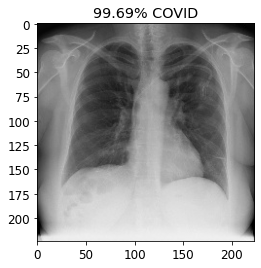

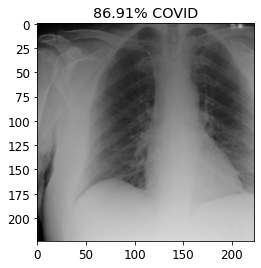

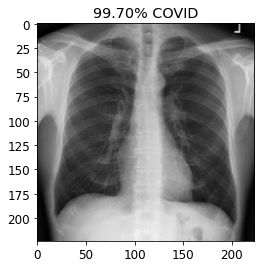

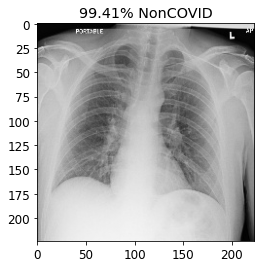

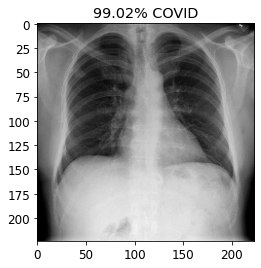

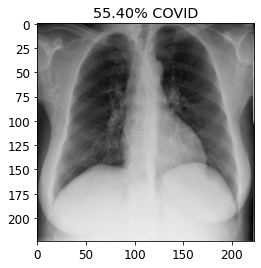

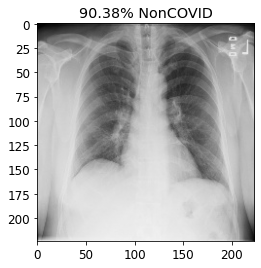

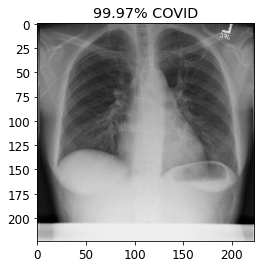

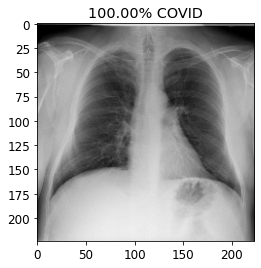

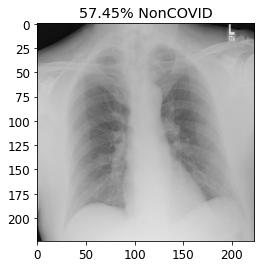

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

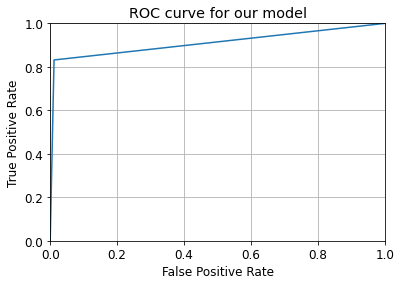

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


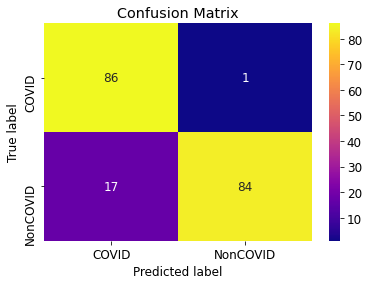

Confusion Matrix with Normalized Values


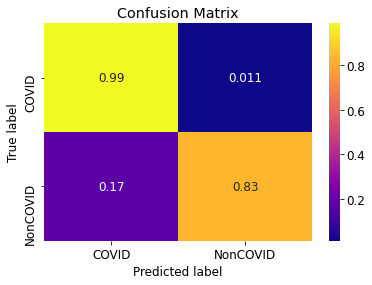

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.83      0.99      0.91        87
           1       0.99      0.83      0.90       101

    accuracy                           0.90       188
   macro avg       0.91      0.91      0.90       188
weighted avg       0.92      0.90      0.90       188



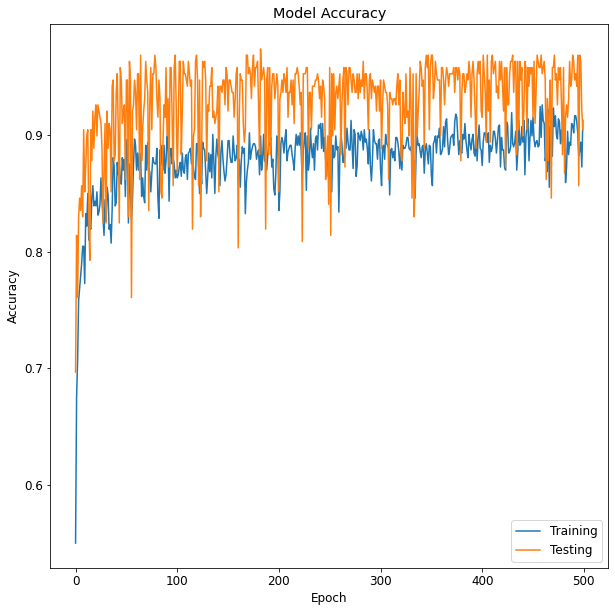

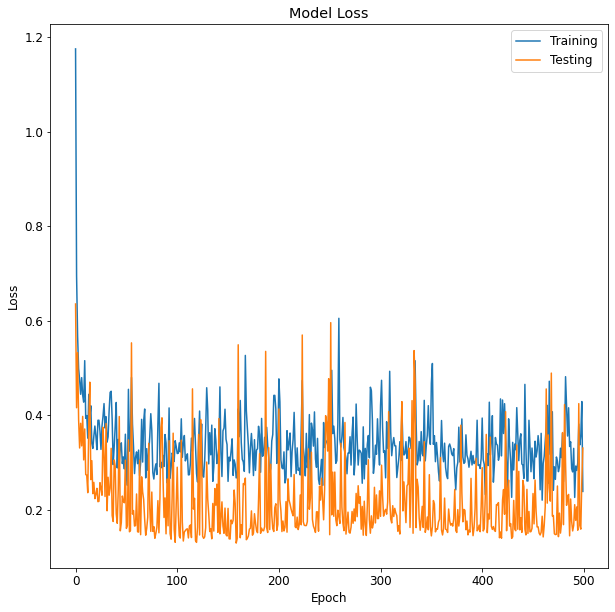

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG19/vgg19_chest_accuracy.png')
plt.show()



plt.figure(figsize=(10,10))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG19/vgg19_chest_loss.png')
plt.show()

# VGG16

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 500
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/3a9c2da0-7cf6-4d51-8012-096f6f4e461e.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8c48a7-3158-4df1-b484-b6f677ff9612.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2c96c09b-aaa8-4c07-8e69-c2210f04be2d.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2a2f58c6-73d5-4e72-82ec-e07daa759544.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

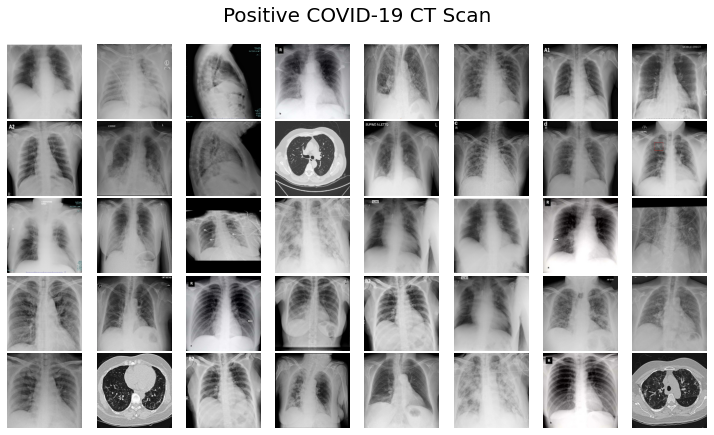

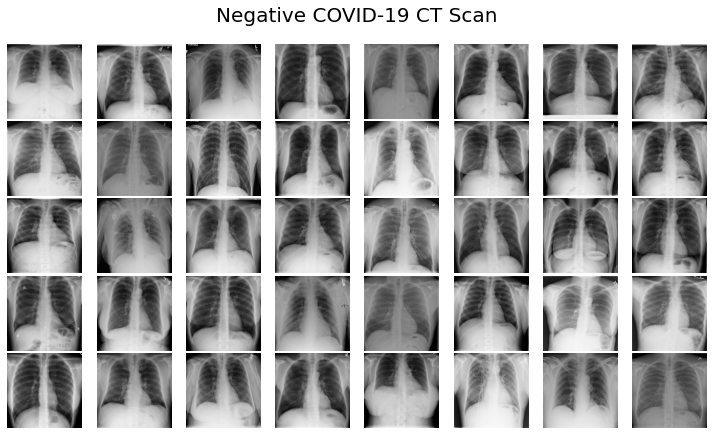

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

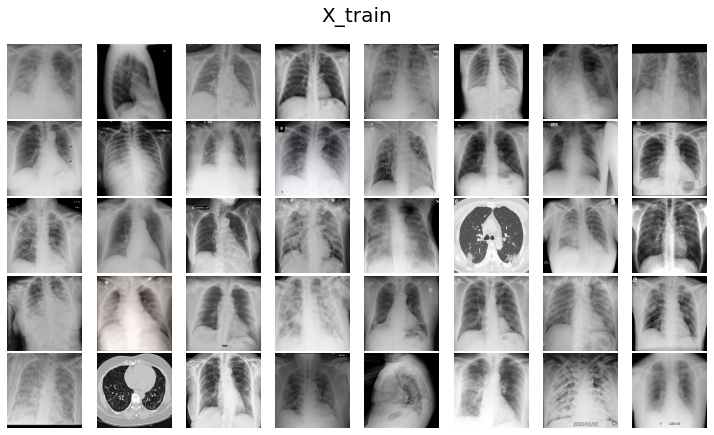

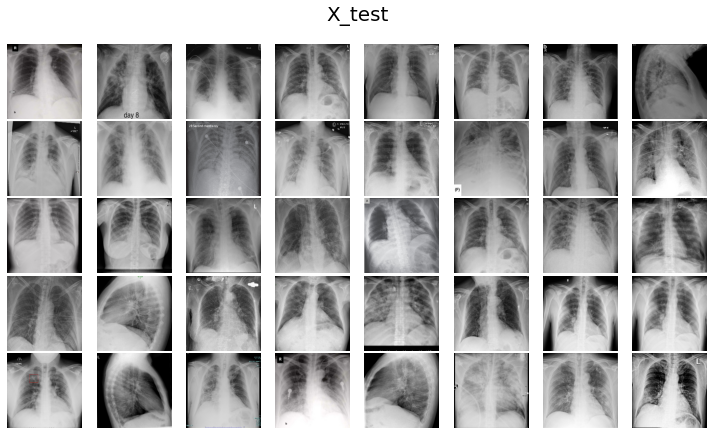

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = VGG16(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

58892288/58889256 [==============================] - 0s 0us/step


In [ ]:
train_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=500)

Epoch 1/500
23/23 [==============================] - 9s 371ms/step - loss: 0.9377 - accuracy: 0.5769 - val_loss: 0.4559 - val_accuracy: 0.7713
Epoch 2/500
23/23 [==============================] - 9s 363ms/step - loss: 0.5760 - accuracy: 0.7290 - val_loss: 0.3758 - val_accuracy: 0.8245
Epoch 3/500
23/23 [==============================] - 9s 361ms/step - loss: 0.4074 - accuracy: 0.8233 - val_loss: 0.3365 - val_accuracy: 0.8617
Epoch 4/500
23/23 [==============================] - 9s 361ms/step - loss: 0.3861 - accuracy: 0.8294 - val_loss: 0.3120 - val_accuracy: 0.8670
Epoch 5/500
23/23 [==============================] - 9s 360ms/step - loss: 0.3386 - accuracy: 0.8593 - val_loss: 0.3582 - val_accuracy: 0.8670
Epoch 6/500
23/23 [==============================] - 8s 358ms/step - loss: 0.3957 - accuracy: 0.8218 - val_loss: 0.2990 - val_accuracy: 0.8404
Epoch 7/500
23/23 [==============================] - 8s 357ms/step - loss: 0.3391 - accuracy: 0.8424 - val_loss: 0.2603 - val_accuracy: 0.8989

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG16/vgg16_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG16/vgg16weights_chest.hdf5')

In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG16/vgg16_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

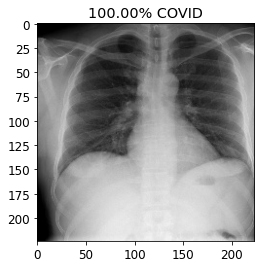

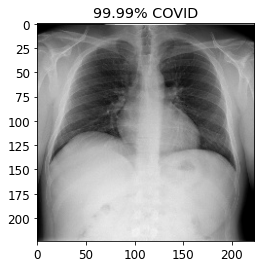

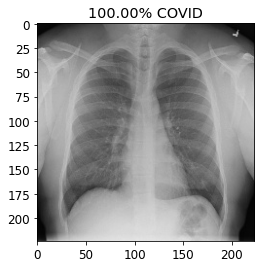

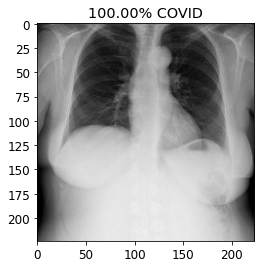

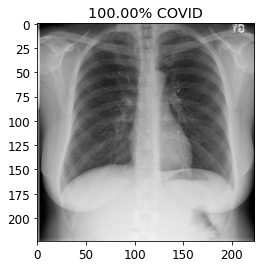

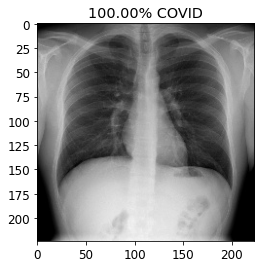

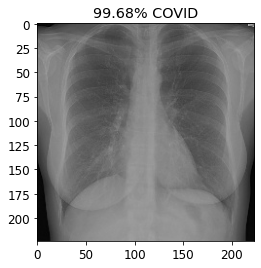

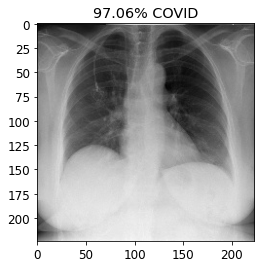

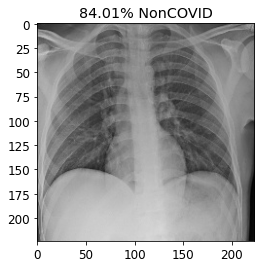

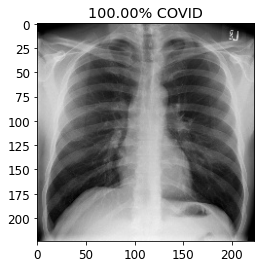

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

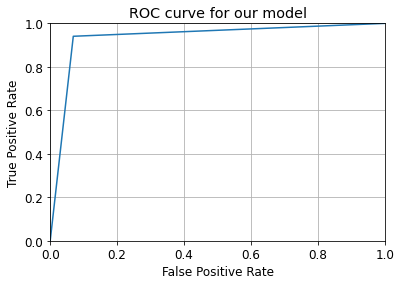

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


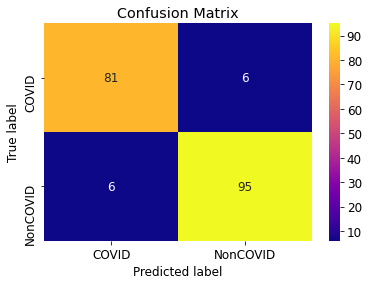

Confusion Matrix with Normalized Values


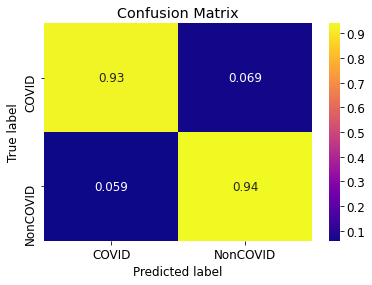

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93        87
           1       0.94      0.94      0.94       101

    accuracy                           0.94       188
   macro avg       0.94      0.94      0.94       188
weighted avg       0.94      0.94      0.94       188



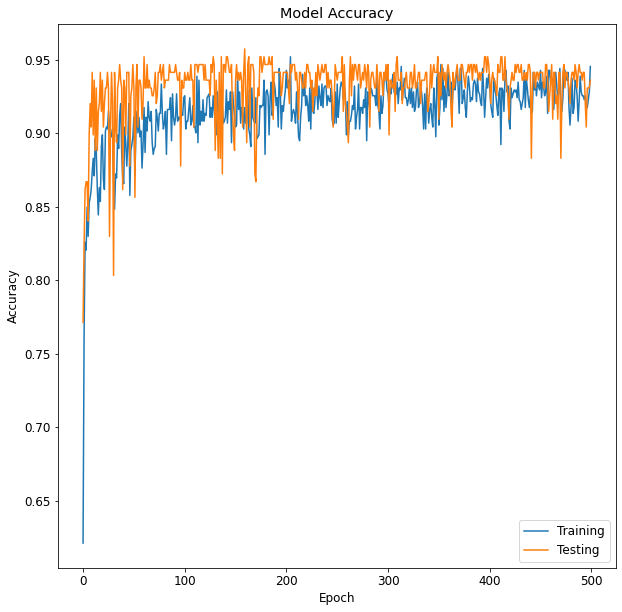

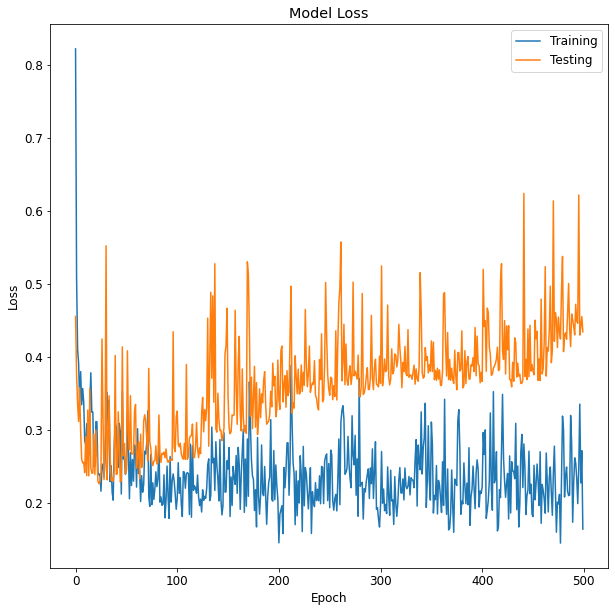

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG16/vgg16_chest_accuracy.png')
plt.show()



plt.figure(figsize=(10,10))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/VGG16/vgg16_chest_loss.png')
plt.show()

# Xception

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 500
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/3a9c2da0-7cf6-4d51-8012-096f6f4e461e.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8c48a7-3158-4df1-b484-b6f677ff9612.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2c96c09b-aaa8-4c07-8e69-c2210f04be2d.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2a2f58c6-73d5-4e72-82ec-e07daa759544.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

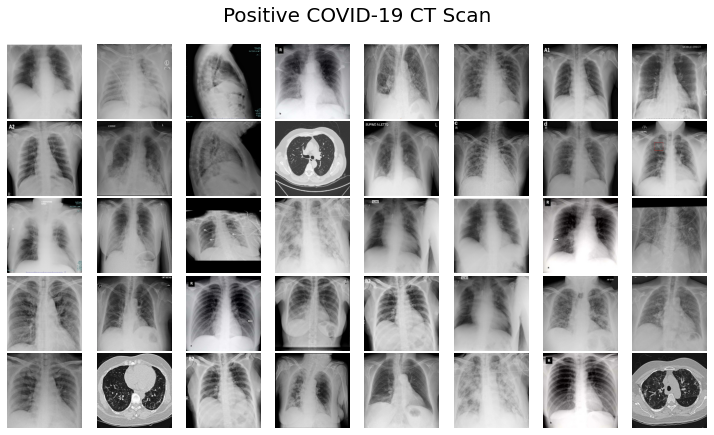

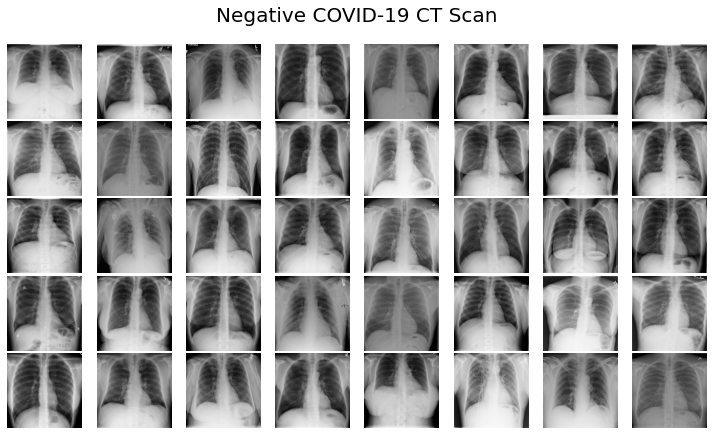

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

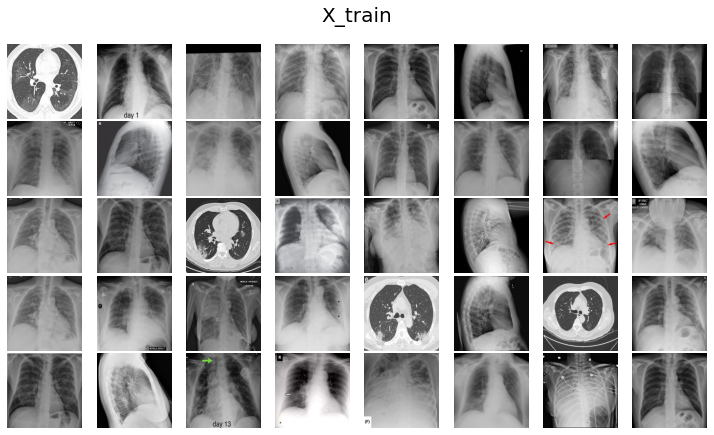

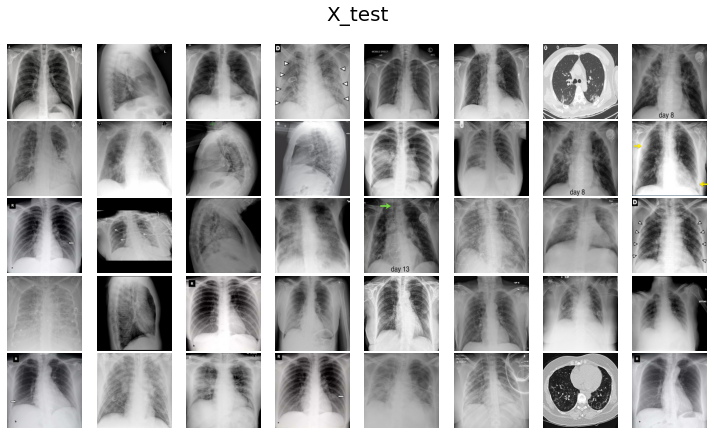

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = Xception(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

83689472/83683744 [==============================] - 0s 0us/step


In [ ]:
train_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=300)

Epoch 1/300
23/23 [==============================] - 13s 429ms/step - loss: 2.3300 - accuracy: 0.6789 - val_loss: 1.0660 - val_accuracy: 0.7872
Epoch 2/300
23/23 [==============================] - 9s 380ms/step - loss: 0.8826 - accuracy: 0.8211 - val_loss: 0.8156 - val_accuracy: 0.8457
Epoch 3/300
23/23 [==============================] - 9s 382ms/step - loss: 0.7096 - accuracy: 0.8490 - val_loss: 0.5352 - val_accuracy: 0.8830
Epoch 4/300
23/23 [==============================] - 9s 381ms/step - loss: 0.4694 - accuracy: 0.8917 - val_loss: 0.4741 - val_accuracy: 0.8777
Epoch 5/300
23/23 [==============================] - 9s 382ms/step - loss: 0.4697 - accuracy: 0.8808 - val_loss: 0.5503 - val_accuracy: 0.8777
Epoch 6/300
23/23 [==============================] - 9s 386ms/step - loss: 0.4542 - accuracy: 0.8655 - val_loss: 0.4425 - val_accuracy: 0.8830
Epoch 7/300
23/23 [==============================] - 9s 382ms/step - loss: 0.3708 - accuracy: 0.9030 - val_loss: 0.3771 - val_accuracy: 0.867

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/Xception/Xception_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/Xception/Xceptionweights_chest.hdf5')

In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/Xception/Xception_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

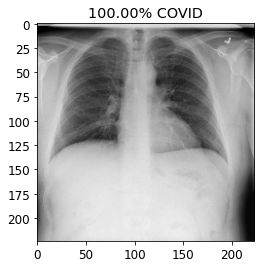

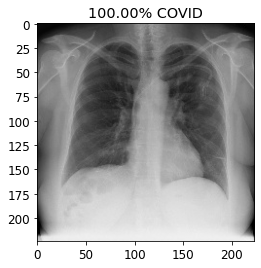

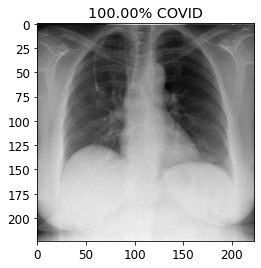

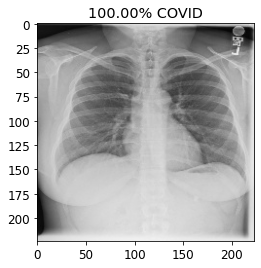

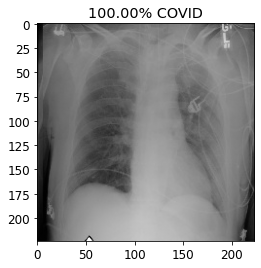

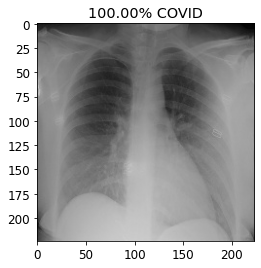

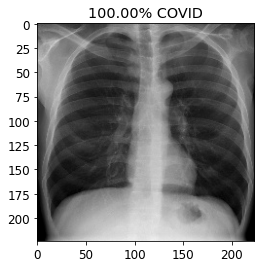

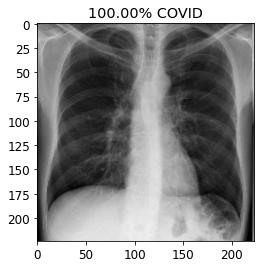

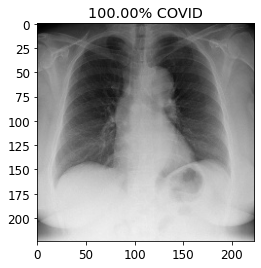

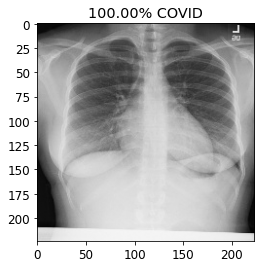

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

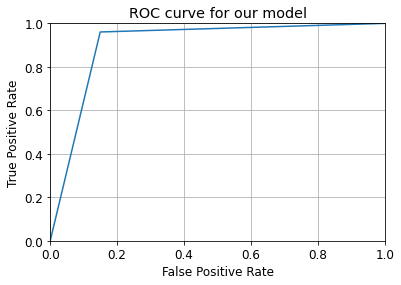

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


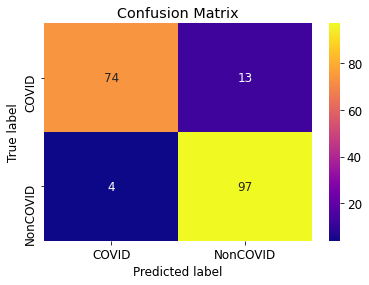

Confusion Matrix with Normalized Values


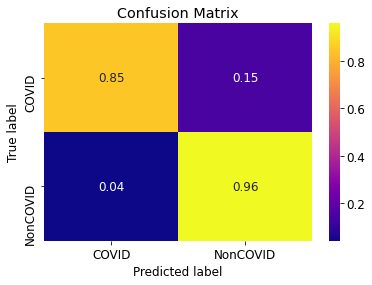

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.95      0.85      0.90        87
           1       0.88      0.96      0.92       101

    accuracy                           0.91       188
   macro avg       0.92      0.91      0.91       188
weighted avg       0.91      0.91      0.91       188



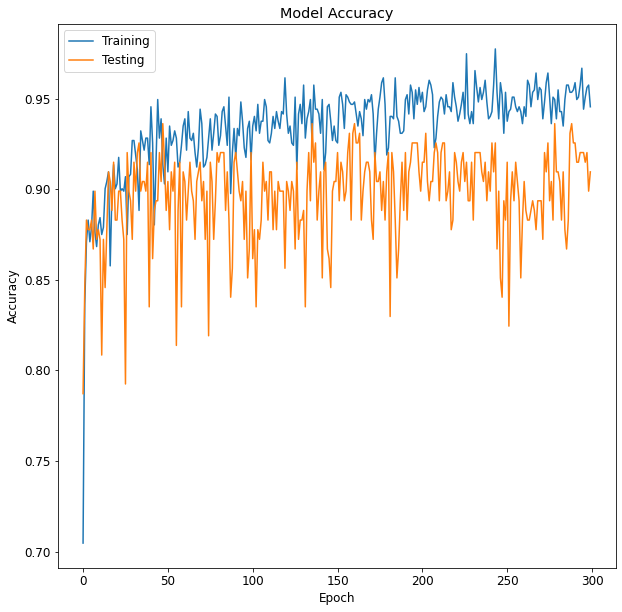

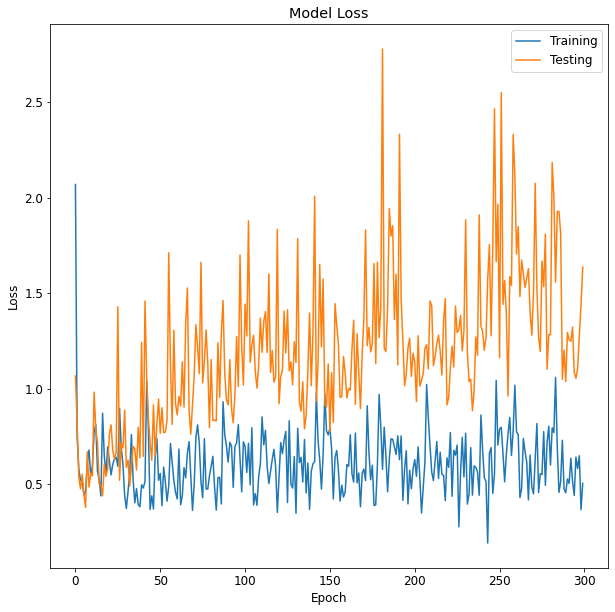

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/Xception/Xception_chest_accuracy.png')
plt.show()



plt.figure(figsize=(10,10))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/Xception/Xception_chest_loss.png')
plt.show()

# Resnet50 V2

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 500
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/3a9c2da0-7cf6-4d51-8012-096f6f4e461e.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8c48a7-3158-4df1-b484-b6f677ff9612.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2c96c09b-aaa8-4c07-8e69-c2210f04be2d.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2a2f58c6-73d5-4e72-82ec-e07daa759544.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

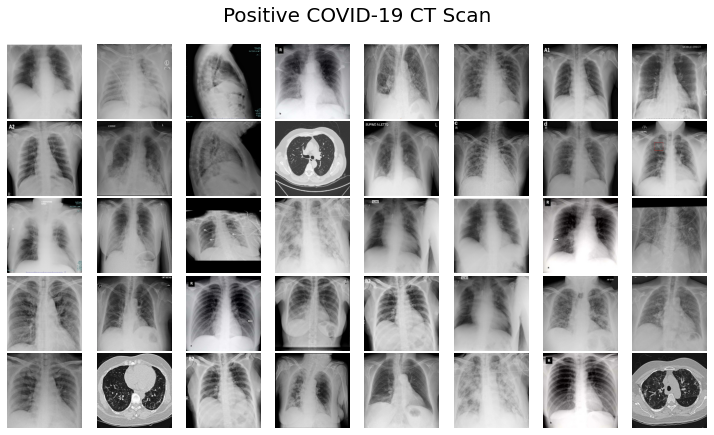

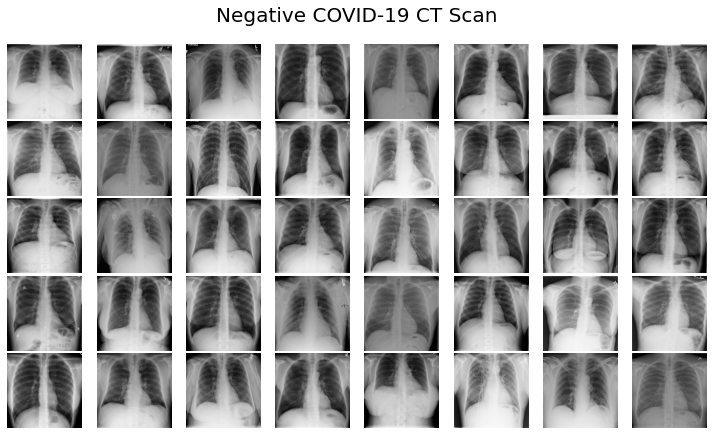

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

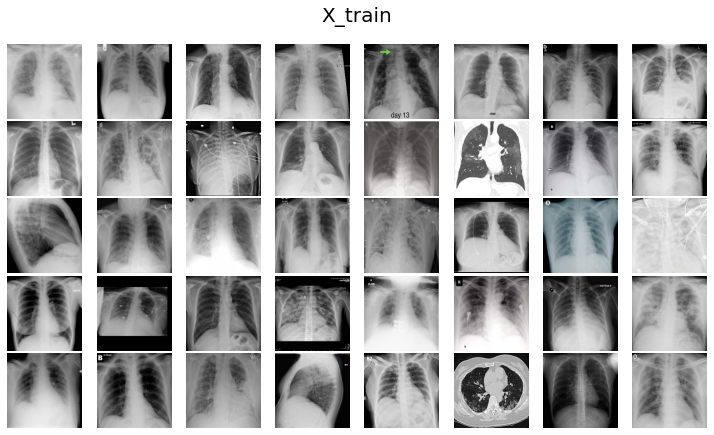

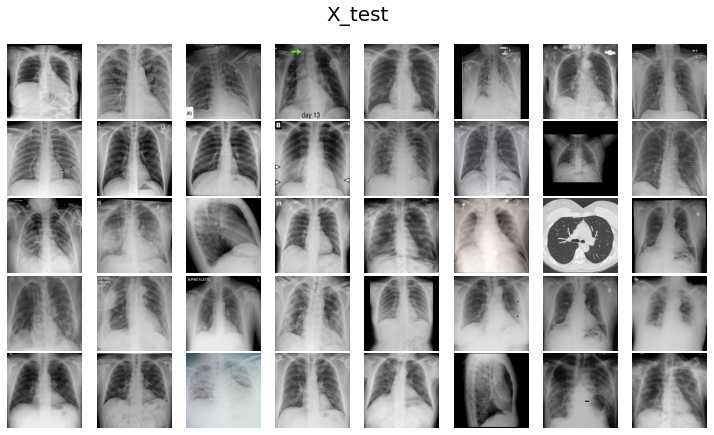

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = ResNet50V2(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

94674944/94668760 [==============================] - 0s 0us/step


In [ ]:
train_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=300)

Epoch 1/300
23/23 [==============================] - 12s 400ms/step - loss: 3.7742 - accuracy: 0.6557 - val_loss: 0.8670 - val_accuracy: 0.8777
Epoch 2/300
23/23 [==============================] - 8s 349ms/step - loss: 2.1547 - accuracy: 0.8217 - val_loss: 1.9343 - val_accuracy: 0.8404
Epoch 3/300
23/23 [==============================] - 8s 346ms/step - loss: 1.3479 - accuracy: 0.8792 - val_loss: 1.0659 - val_accuracy: 0.8989
Epoch 4/300
23/23 [==============================] - 8s 345ms/step - loss: 0.9157 - accuracy: 0.8875 - val_loss: 1.6821 - val_accuracy: 0.7979
Epoch 5/300
23/23 [==============================] - 8s 345ms/step - loss: 1.1416 - accuracy: 0.8760 - val_loss: 1.1374 - val_accuracy: 0.8883
Epoch 6/300
23/23 [==============================] - 8s 349ms/step - loss: 1.2384 - accuracy: 0.8926 - val_loss: 1.0169 - val_accuracy: 0.8936
Epoch 7/300
23/23 [==============================] - 8s 346ms/step - loss: 1.0338 - accuracy: 0.8830 - val_loss: 1.5006 - val_accuracy: 0.872

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet50V2/ResNet50V2_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet50V2/ResNet50V2weights_chest.hdf5')

In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet50V2/ResNet50V2_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

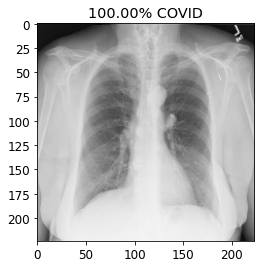

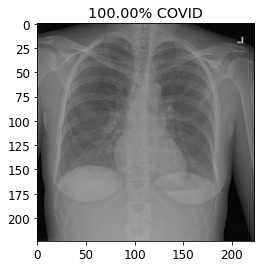

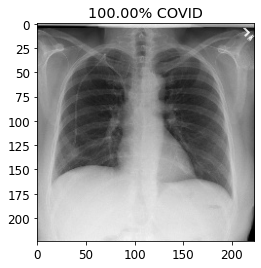

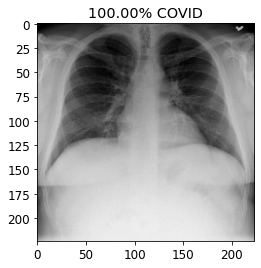

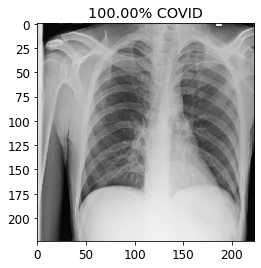

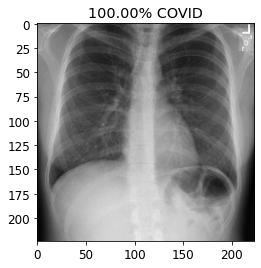

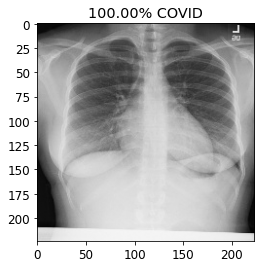

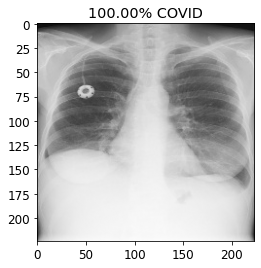

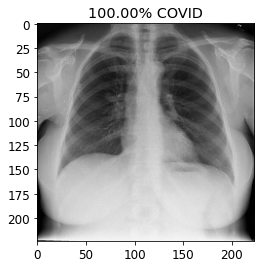

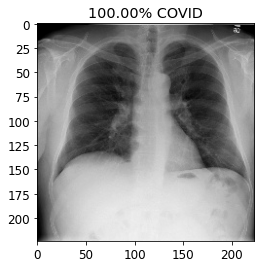

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

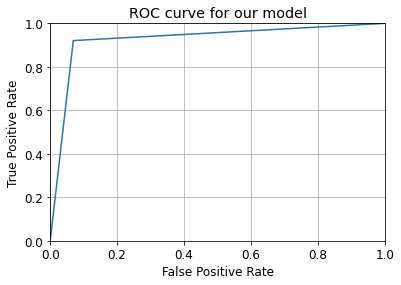

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


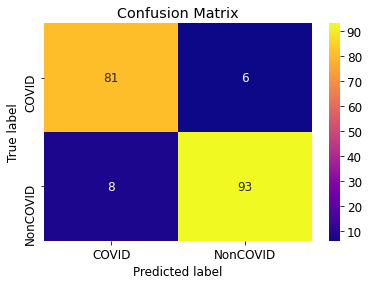

Confusion Matrix with Normalized Values


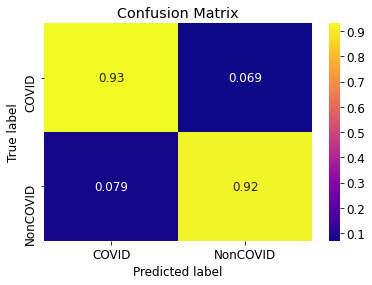

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92        87
           1       0.94      0.92      0.93       101

    accuracy                           0.93       188
   macro avg       0.92      0.93      0.93       188
weighted avg       0.93      0.93      0.93       188



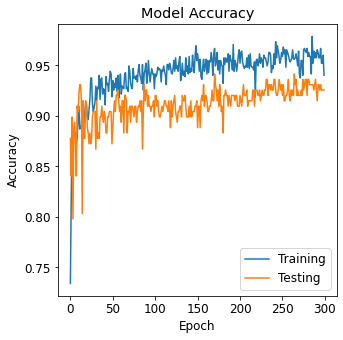

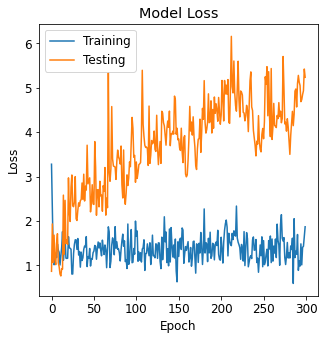

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet50V2/ResNet50V2_chest_accuracy.png')
plt.show()



plt.figure(figsize=(5,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet50V2/ResNet50V2_chest_loss.png')
plt.show()

# InceptionV3

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 500
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/3a9c2da0-7cf6-4d51-8012-096f6f4e461e.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8c48a7-3158-4df1-b484-b6f677ff9612.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2c96c09b-aaa8-4c07-8e69-c2210f04be2d.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2a2f58c6-73d5-4e72-82ec-e07daa759544.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

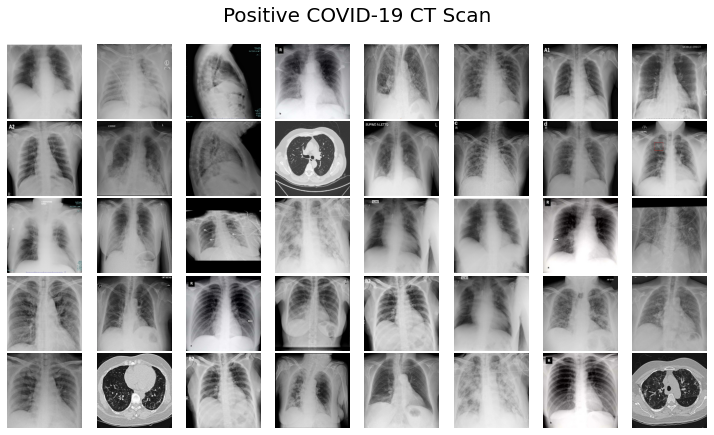

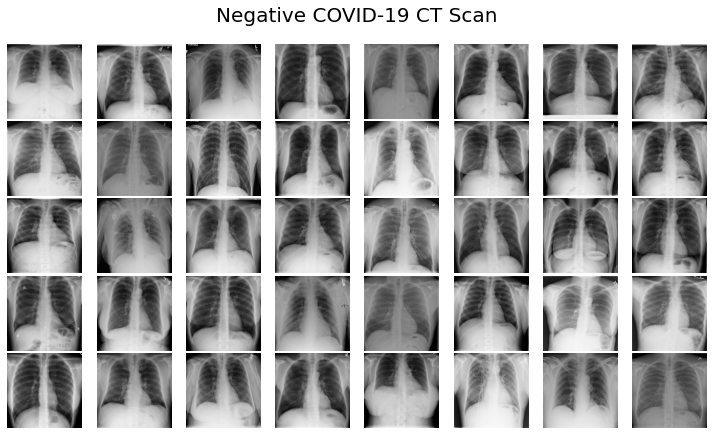

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

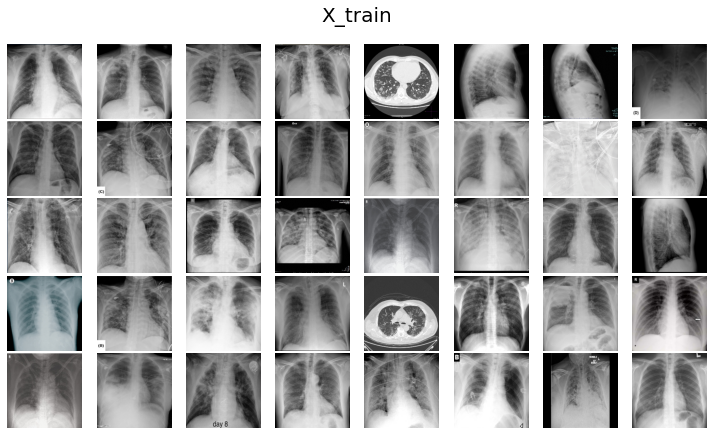

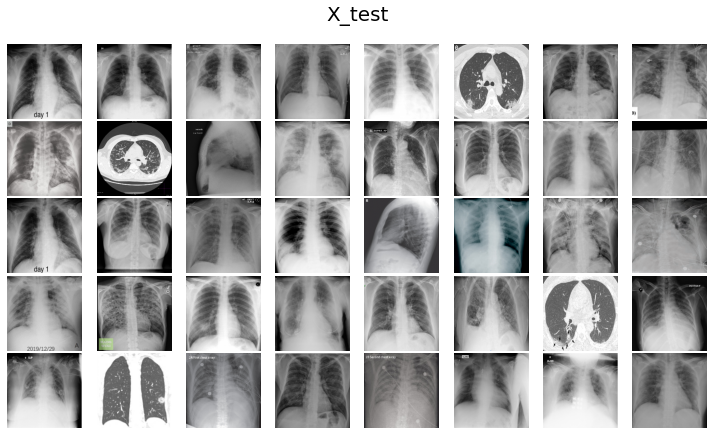

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = InceptionV3(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

87916544/87910968 [==============================] - 0s 0us/step


In [ ]:
train_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=300)

Epoch 1/300
23/23 [==============================] - 14s 425ms/step - loss: 8.4456 - accuracy: 0.5170 - val_loss: 2.1813 - val_accuracy: 0.7553
Epoch 2/300
23/23 [==============================] - 8s 341ms/step - loss: 1.6941 - accuracy: 0.8239 - val_loss: 1.5069 - val_accuracy: 0.8138
Epoch 3/300
23/23 [==============================] - 8s 340ms/step - loss: 1.0422 - accuracy: 0.8673 - val_loss: 1.7969 - val_accuracy: 0.6649
Epoch 4/300
23/23 [==============================] - 8s 346ms/step - loss: 1.1485 - accuracy: 0.8181 - val_loss: 0.6077 - val_accuracy: 0.8351
Epoch 5/300
23/23 [==============================] - 8s 341ms/step - loss: 0.6636 - accuracy: 0.8709 - val_loss: 0.5708 - val_accuracy: 0.8723
Epoch 6/300
23/23 [==============================] - 8s 343ms/step - loss: 0.5961 - accuracy: 0.8633 - val_loss: 0.8858 - val_accuracy: 0.8511
Epoch 7/300
23/23 [==============================] - 8s 344ms/step - loss: 0.7149 - accuracy: 0.8724 - val_loss: 0.7853 - val_accuracy: 0.861

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/InceptionV3/InceptionV3_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/InceptionV3/InceptionV3weights_chest.hdf5')

In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/InceptionV3/InceptionV3_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

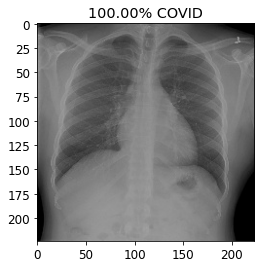

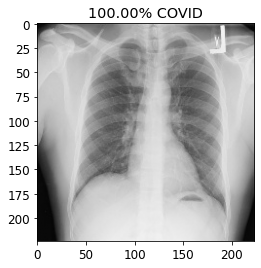

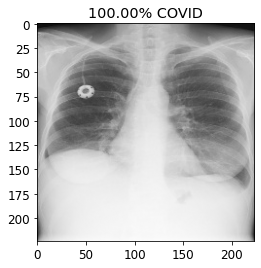

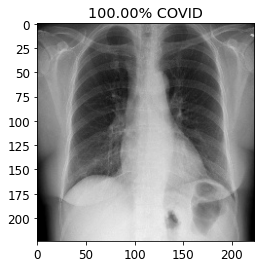

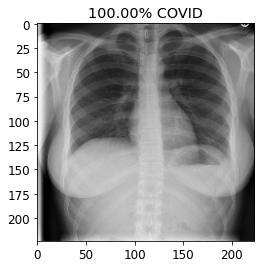

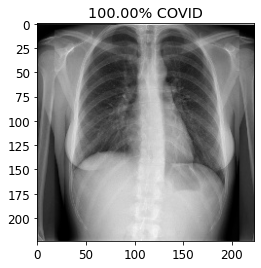

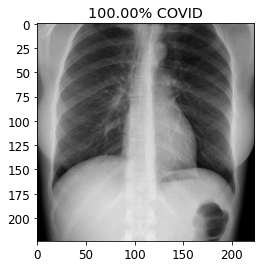

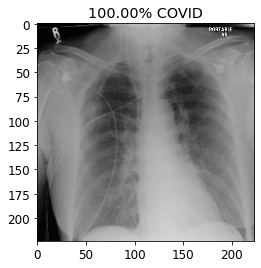

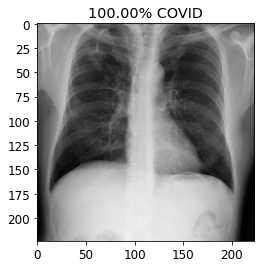

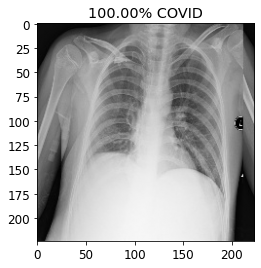

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

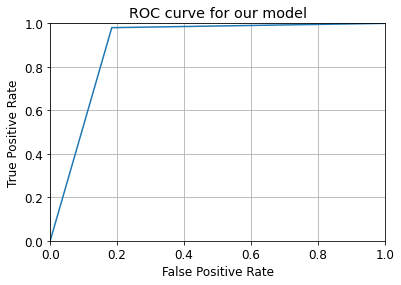

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


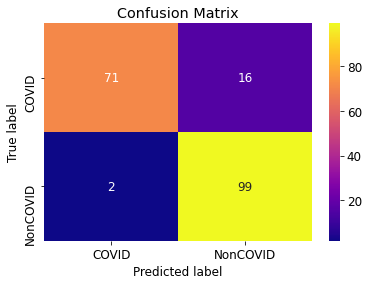

Confusion Matrix with Normalized Values


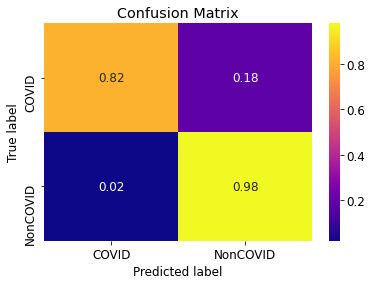

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.97      0.82      0.89        87
           1       0.86      0.98      0.92       101

    accuracy                           0.90       188
   macro avg       0.92      0.90      0.90       188
weighted avg       0.91      0.90      0.90       188



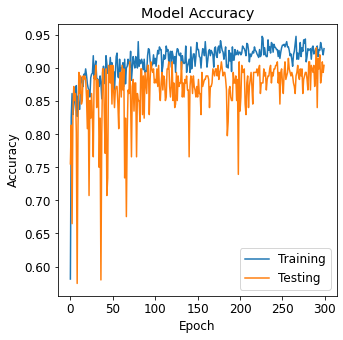

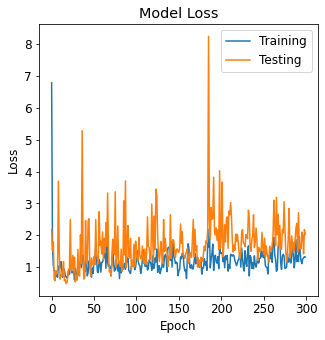

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/InceptionV3/InceptionV3_chest_accuracy.png')
plt.show()



plt.figure(figsize=(5,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/InceptionV3/InceptionV3_chest_loss.png')
plt.show()

# Resnet 101 V2

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 500
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/3a9c2da0-7cf6-4d51-8012-096f6f4e461e.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8c48a7-3158-4df1-b484-b6f677ff9612.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2c96c09b-aaa8-4c07-8e69-c2210f04be2d.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2a2f58c6-73d5-4e72-82ec-e07daa759544.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

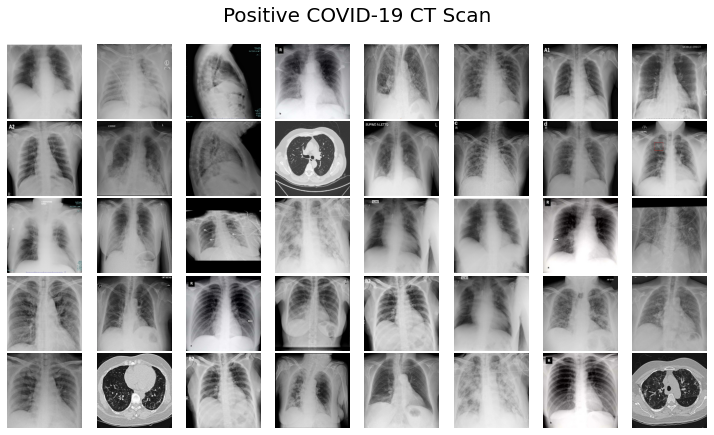

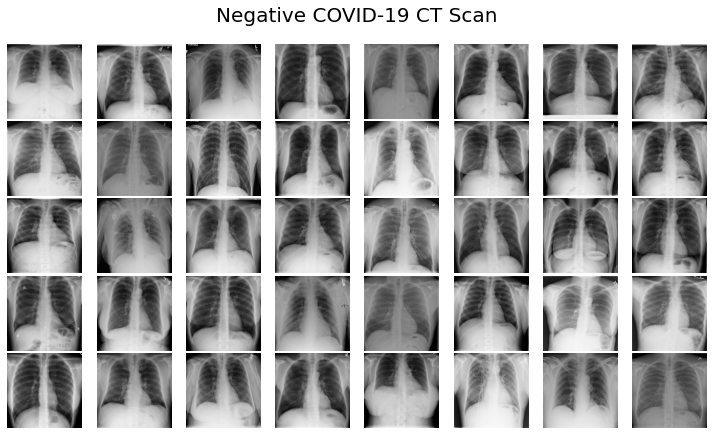

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

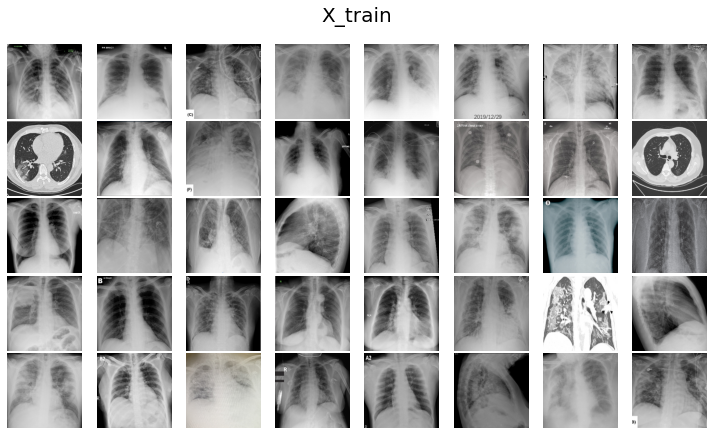

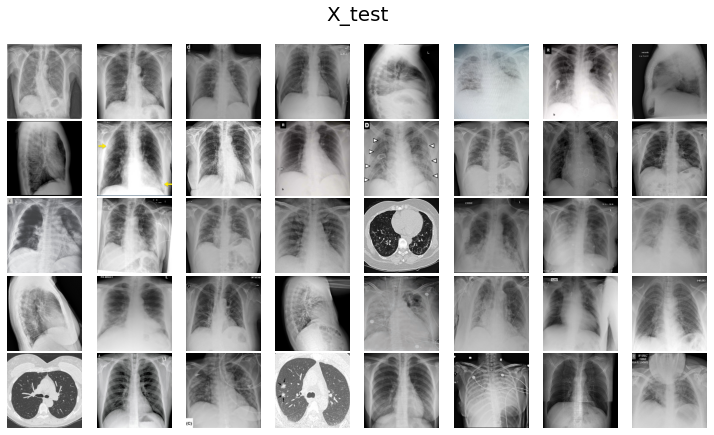

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = ResNet101V2(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

171319296/171317808 [==============================] - 1s 0us/step


In [ ]:
train_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=300)

Epoch 1/300
23/23 [==============================] - 15s 448ms/step - loss: 2.0923 - accuracy: 0.7025 - val_loss: 1.2310 - val_accuracy: 0.8617
Epoch 2/300
23/23 [==============================] - 9s 393ms/step - loss: 1.7945 - accuracy: 0.8061 - val_loss: 1.4732 - val_accuracy: 0.8670
Epoch 3/300
23/23 [==============================] - 9s 392ms/step - loss: 1.4738 - accuracy: 0.8550 - val_loss: 1.8820 - val_accuracy: 0.8511
Epoch 4/300
23/23 [==============================] - 9s 389ms/step - loss: 1.2260 - accuracy: 0.8861 - val_loss: 0.6909 - val_accuracy: 0.9202
Epoch 5/300
23/23 [==============================] - 9s 390ms/step - loss: 1.6240 - accuracy: 0.8753 - val_loss: 0.5236 - val_accuracy: 0.9043
Epoch 6/300
23/23 [==============================] - 9s 391ms/step - loss: 1.1469 - accuracy: 0.8802 - val_loss: 0.5788 - val_accuracy: 0.9255
Epoch 7/300
23/23 [==============================] - 9s 390ms/step - loss: 0.9554 - accuracy: 0.9006 - val_loss: 0.7743 - val_accuracy: 0.909

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet101V2/ResNet101V2_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet101V2/ResNet101V2weights_chest.hdf5')

In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet101V2/ResNet101V2_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

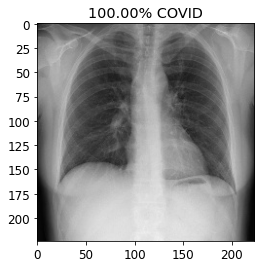

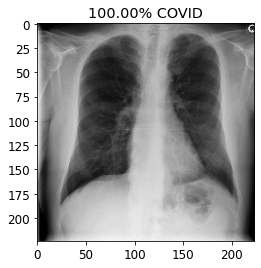

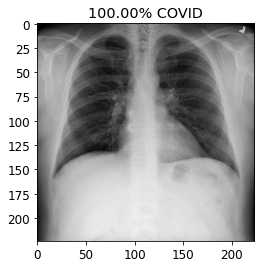

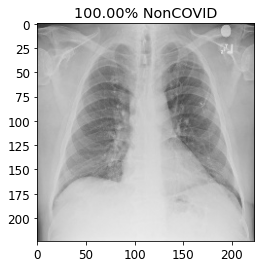

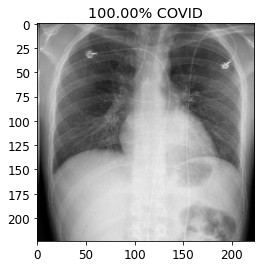

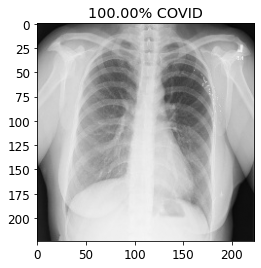

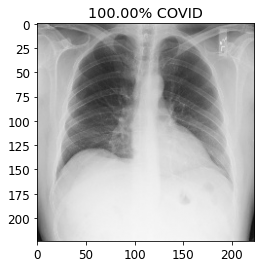

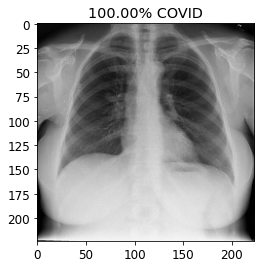

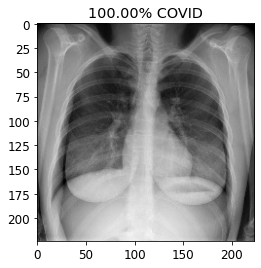

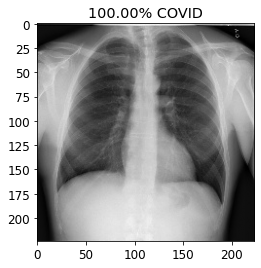

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

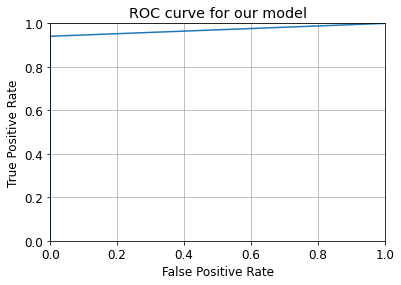

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


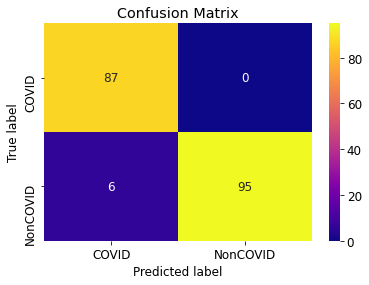

Confusion Matrix with Normalized Values


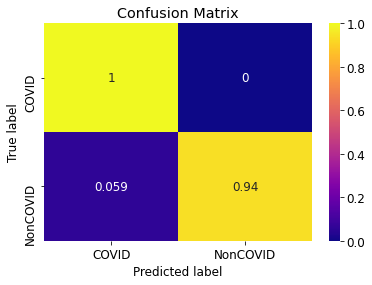

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97        87
           1       1.00      0.94      0.97       101

    accuracy                           0.97       188
   macro avg       0.97      0.97      0.97       188
weighted avg       0.97      0.97      0.97       188



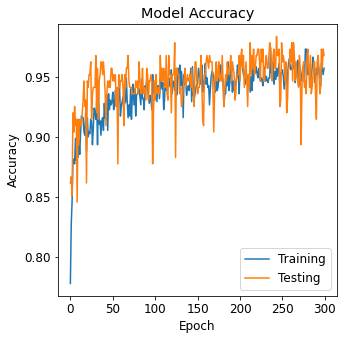

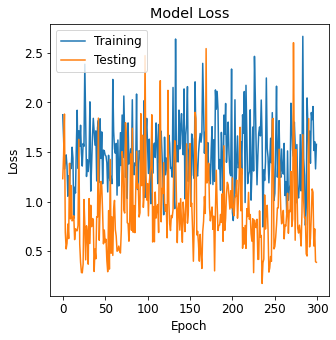

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet101V2/ResNet101V2_chest_accuracy.png')
plt.show()



plt.figure(figsize=(5,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet101V2/ResNet101V2_chest_loss.png')
plt.show()

# Densenet121

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 500
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/3a9c2da0-7cf6-4d51-8012-096f6f4e461e.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8c48a7-3158-4df1-b484-b6f677ff9612.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2c96c09b-aaa8-4c07-8e69-c2210f04be2d.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2a2f58c6-73d5-4e72-82ec-e07daa759544.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

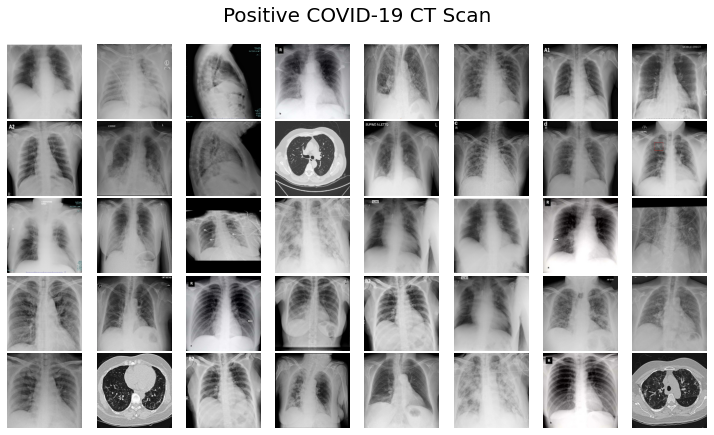

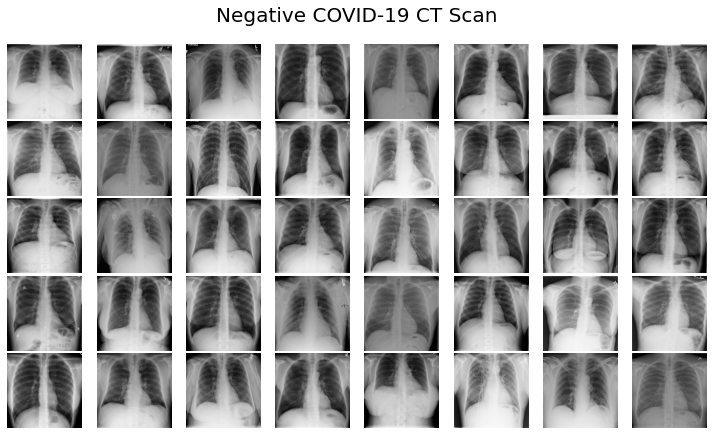

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

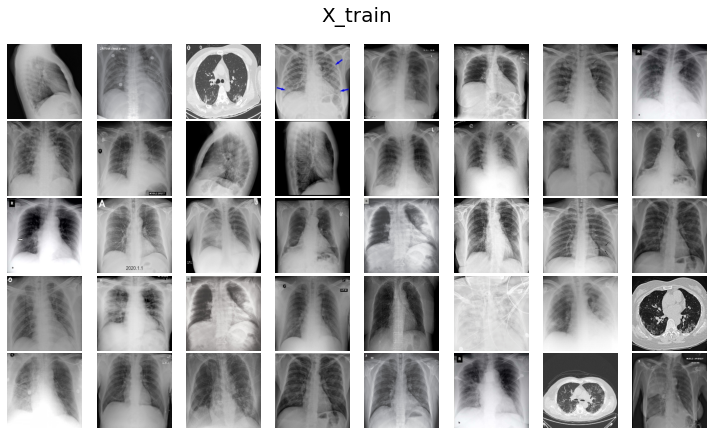

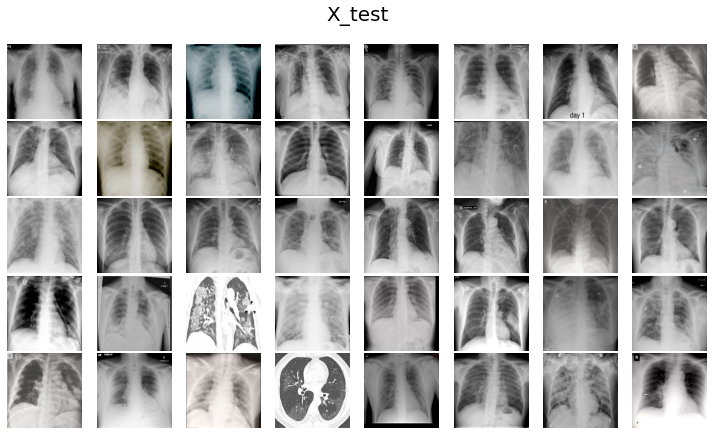

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = DenseNet121(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

29089792/29084464 [==============================] - 0s 0us/step


In [ ]:
train_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=300)

Epoch 1/300
23/23 [==============================] - 16s 450ms/step - loss: 1.4194 - accuracy: 0.6560 - val_loss: 2.2969 - val_accuracy: 0.6649
Epoch 2/300
23/23 [==============================] - 8s 353ms/step - loss: 1.1885 - accuracy: 0.7755 - val_loss: 0.6379 - val_accuracy: 0.8883
Epoch 3/300
23/23 [==============================] - 8s 353ms/step - loss: 0.7092 - accuracy: 0.8576 - val_loss: 0.6781 - val_accuracy: 0.8723
Epoch 4/300
23/23 [==============================] - 8s 349ms/step - loss: 0.6049 - accuracy: 0.8677 - val_loss: 0.6744 - val_accuracy: 0.8936
Epoch 5/300
23/23 [==============================] - 8s 350ms/step - loss: 0.5481 - accuracy: 0.8942 - val_loss: 0.7044 - val_accuracy: 0.8936
Epoch 6/300
23/23 [==============================] - 8s 352ms/step - loss: 0.6741 - accuracy: 0.8774 - val_loss: 0.7748 - val_accuracy: 0.8723
Epoch 7/300
23/23 [==============================] - 9s 364ms/step - loss: 0.6532 - accuracy: 0.8751 - val_loss: 1.0268 - val_accuracy: 0.883

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121weights_chest.hdf5')

In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

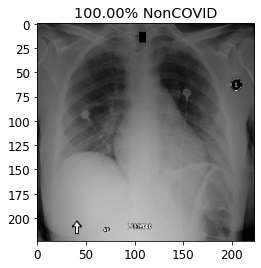

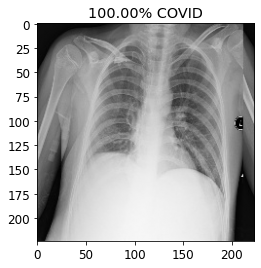

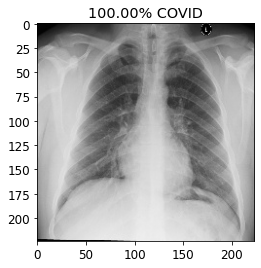

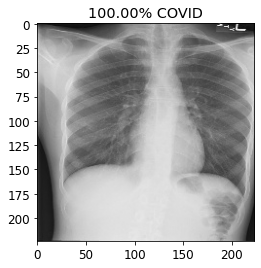

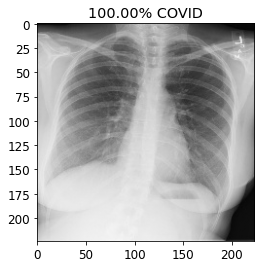

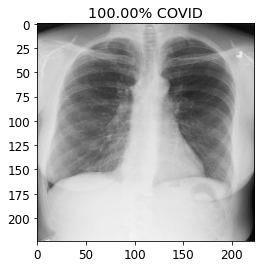

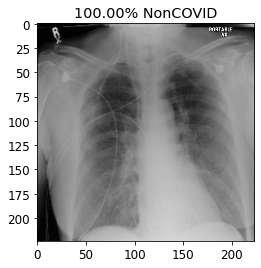

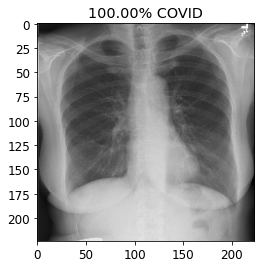

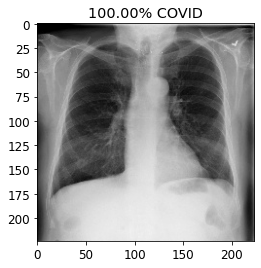

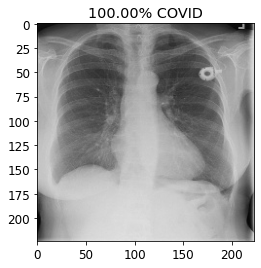

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

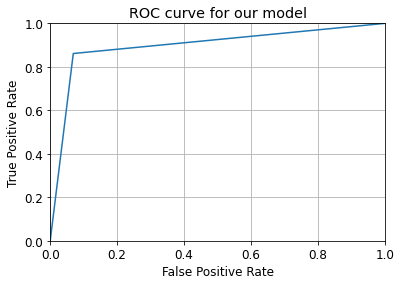

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


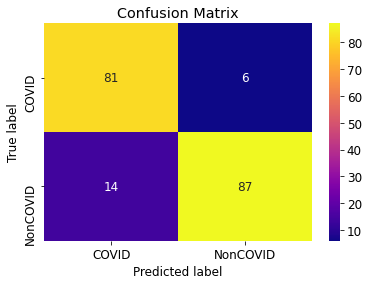

Confusion Matrix with Normalized Values


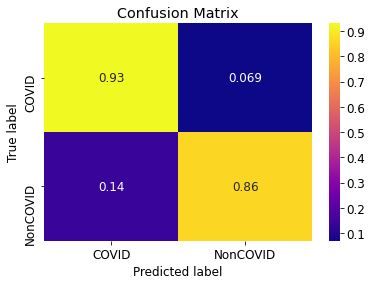

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.85      0.93      0.89        87
           1       0.94      0.86      0.90       101

    accuracy                           0.89       188
   macro avg       0.89      0.90      0.89       188
weighted avg       0.90      0.89      0.89       188



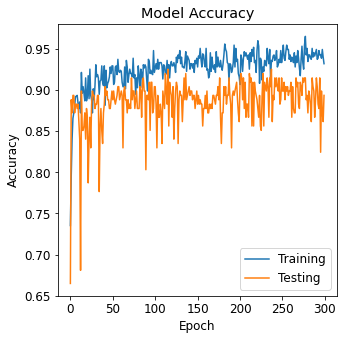

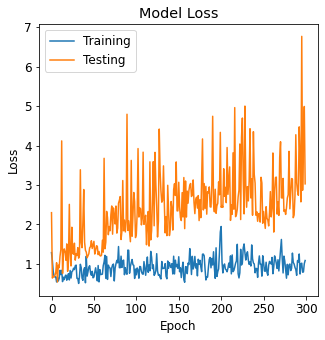

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121_chest_accuracy.png')
plt.show()



plt.figure(figsize=(5,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121_chest_loss.png')
plt.show()

# Resnet50

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 20
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0a828af6-b7c6-4757-88e4-dea54fe6cdc9.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8e3d9e-0bcd-41a3-b788-0175c43b2624.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2e8d7684-3d6d-4516-b849-3666030db7b7.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0cb6fe57-ead1-444b-8563-a51f14014e2d.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

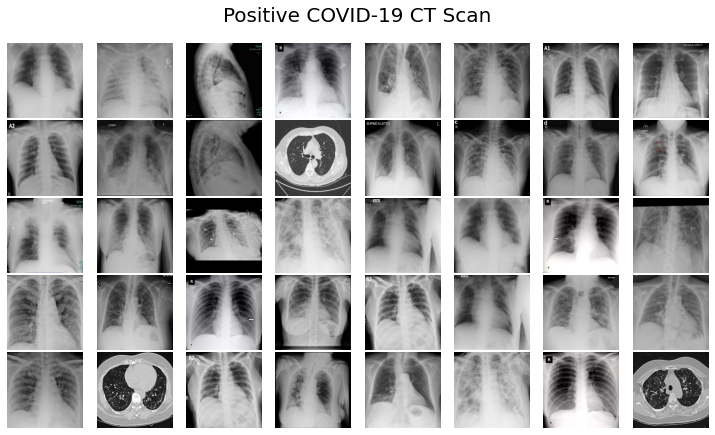

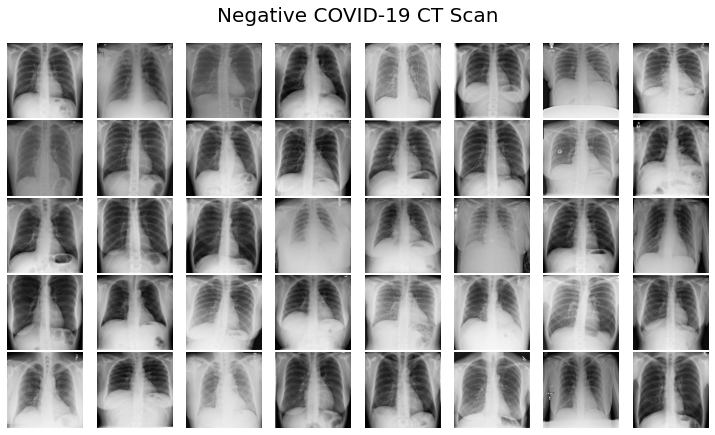

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

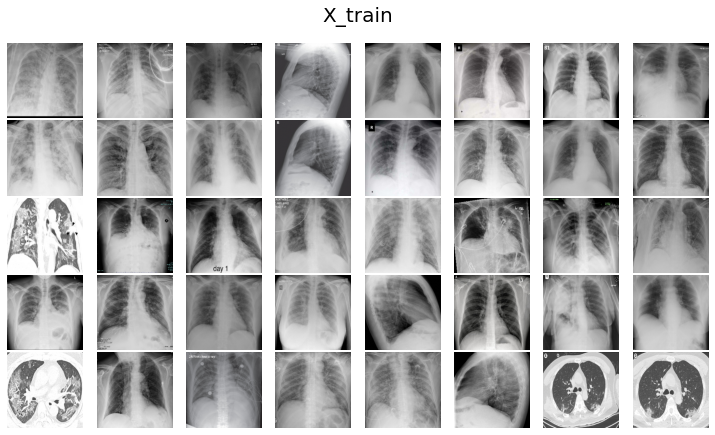

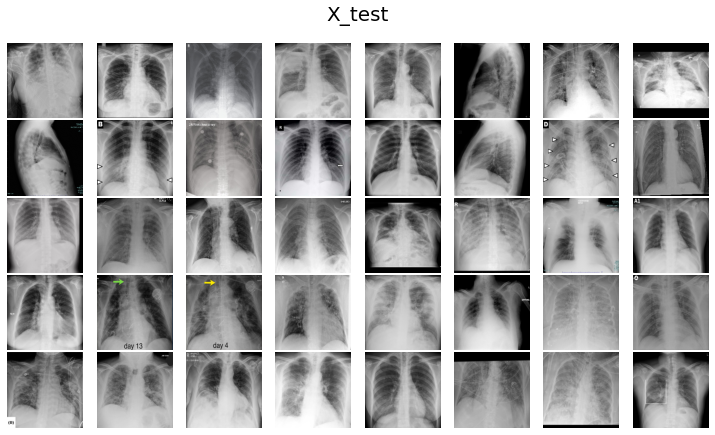

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = ResNet50(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

94781440/94765736 [==============================] - 1s 0us/step


In [ ]:
train_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=20)

Epoch 1/20
23/23 [==============================] - 49s 615ms/step - loss: 3.5653 - accuracy: 0.5013 - val_loss: 1.4818 - val_accuracy: 0.4628
Epoch 2/20
23/23 [==============================] - 12s 489ms/step - loss: 1.0700 - accuracy: 0.5226 - val_loss: 0.7737 - val_accuracy: 0.5638
Epoch 3/20
23/23 [==============================] - 12s 489ms/step - loss: 1.2896 - accuracy: 0.5386 - val_loss: 0.7156 - val_accuracy: 0.4734
Epoch 4/20
23/23 [==============================] - 12s 490ms/step - loss: 1.2027 - accuracy: 0.5093 - val_loss: 0.7925 - val_accuracy: 0.5745
Epoch 5/20
23/23 [==============================] - 12s 490ms/step - loss: 0.9775 - accuracy: 0.5372 - val_loss: 0.9796 - val_accuracy: 0.4628
Epoch 6/20
23/23 [==============================] - 12s 489ms/step - loss: 1.0482 - accuracy: 0.5399 - val_loss: 0.6049 - val_accuracy: 0.6915
Epoch 7/20
23/23 [==============================] - 12s 489ms/step - loss: 1.0020 - accuracy: 0.5798 - val_loss: 0.5968 - val_accuracy: 0.6915

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet50/ResNet50_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet50/ResNet50weights_chest.hdf5')

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/ResNet50/ResNet50_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

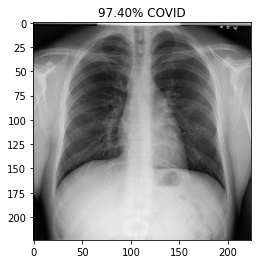

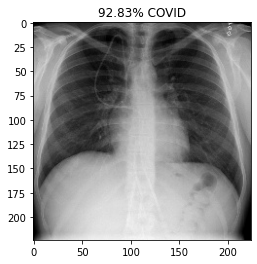

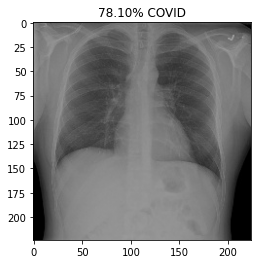

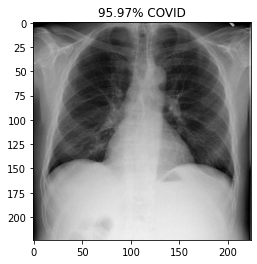

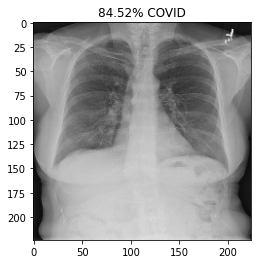

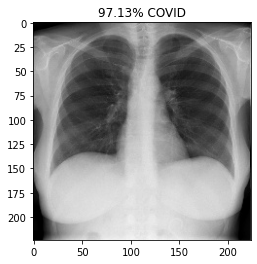

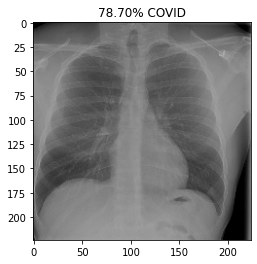

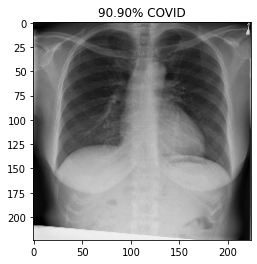

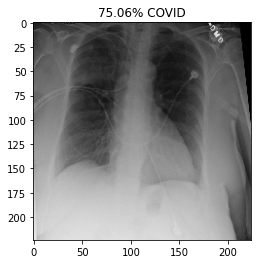

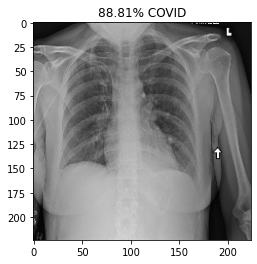

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

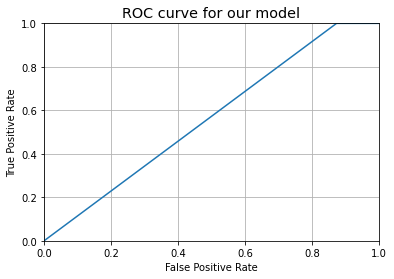

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


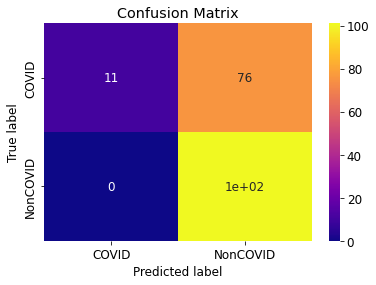

Confusion Matrix with Normalized Values


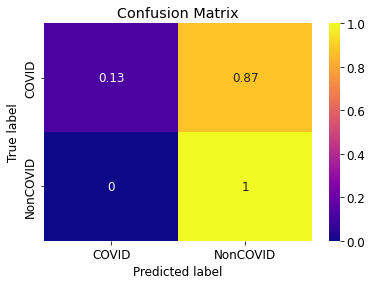

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       1.00      0.13      0.22        87
           1       0.57      1.00      0.73       101

    accuracy                           0.60       188
   macro avg       0.79      0.56      0.48       188
weighted avg       0.77      0.60      0.49       188



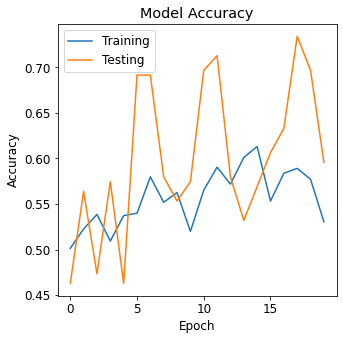

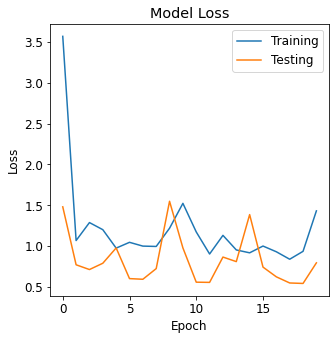

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121_chest_accuracy.png')
plt.show()



plt.figure(figsize=(5,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121_chest_loss.png')
plt.show()

# EfficientNetB0

In [ ]:
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from glob import glob
import pandas as pd
import cv2

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

In [ ]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224]

# training config:
epochs = 20
batch_size = 32

#define paths
covid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID'
noncovid_path = '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID'

# Use glob to grab images from path .jpg or jpeg
covid_files = glob(covid_path + '/*')
noncovid_files = glob(noncovid_path + '/*')

In [ ]:
# Visualize file variable contents
print("First 5 Covid Files: ",covid_files[0:5])
print("Total Count: ",len(covid_files))
print("First 5 NonCovid Files: ",noncovid_files[0:5])
print("Total Count: ",len(noncovid_files))

First 5 Covid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1B734A89-A1BF-49A8-A1D3-66FAFA4FAC5D.jpeg.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/16669_1_1.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/4C4DEFD8-F55D-4588-AAD6-C59017F55966.jpeg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/1.CXRCTThoraximagesofCOVID-19fromSingapore.pdf-002-fig3b.png', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_COVID/6CB4EFC6-68FA-4CD5-940C-BEFA8DAFE9A7.jpeg.jpg']
Total Count:  435
First 5 NonCovid Files:  ['/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0a828af6-b7c6-4757-88e4-dea54fe6cdc9.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0b8e3d9e-0bcd-41a3-b788-0175c43b2624.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/2e8d7684-3d6d-4516-b849-3666030db7b7.jpg', '/content/drive/MyDrive/Chest X-ray IEEE 8023/Chest_NonCOVID/0cb6fe57-ead1-444b-8563-a51f14014e2d.jpg', '/conte

In [ ]:
# Fetch Images and Class Labels from Files
covid_labels = []
noncovid_labels = []

covid_images=[]
noncovid_images=[]

for i in range(len(covid_files)):
  image = cv2.imread(covid_files[i]) # read file 
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # arrange format as per keras
  image = cv2.resize(image,(224,224)) # resize as per model
  covid_images.append(image) # append image
  covid_labels.append('Chest_COVID') #append class label
for i in range(len(noncovid_files)):
  image = cv2.imread(noncovid_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  noncovid_images.append(image)
  noncovid_labels.append('Chest_NonCOVID')

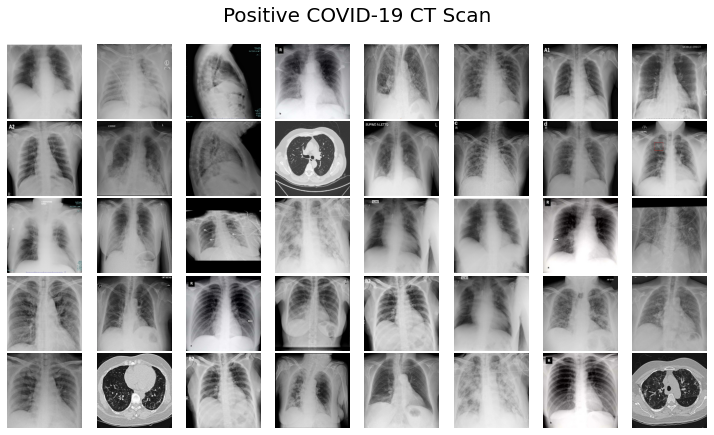

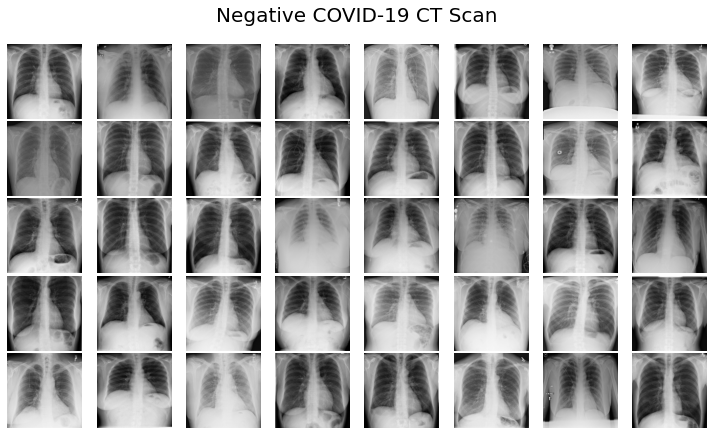

In [ ]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=20)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(covid_images, 'Positive COVID-19 CT Scan')
plot_images(noncovid_images, 'Negative COVID-19 CT Scan')

In [ ]:
# Convert to array and Normalize to interval of [0,1]
covid_images = np.array(covid_images) / 255
noncovid_images = np.array(noncovid_images) / 255

In [ ]:
# Split into training and testing sets for both types of images
covid_x_train, covid_x_test, covid_y_train, covid_y_test = train_test_split(
    covid_images, covid_labels, test_size=0.2)
noncovid_x_train, noncovid_x_test, noncovid_y_train, noncovid_y_test = train_test_split(
    noncovid_images, noncovid_labels, test_size=0.2)

# Merge sets for both types of images
X_train = np.concatenate((noncovid_x_train, covid_x_train), axis=0)
X_test = np.concatenate((noncovid_x_test, covid_x_test), axis=0)
y_train = np.concatenate((noncovid_y_train, covid_y_train), axis=0)
y_test = np.concatenate((noncovid_y_test, covid_y_test), axis=0)

# Make labels into categories - either 0 or 1, for our model
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

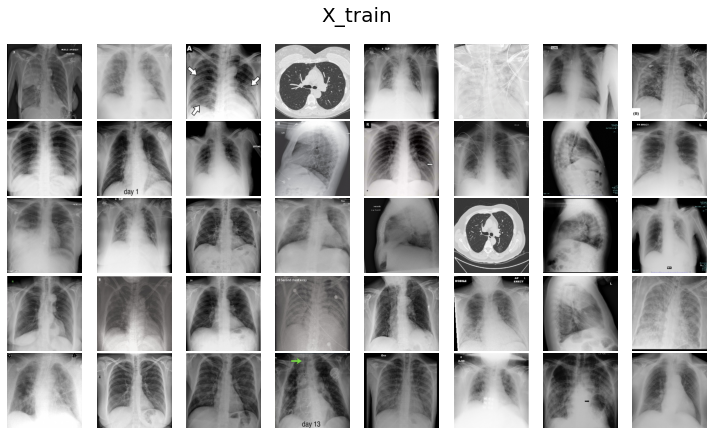

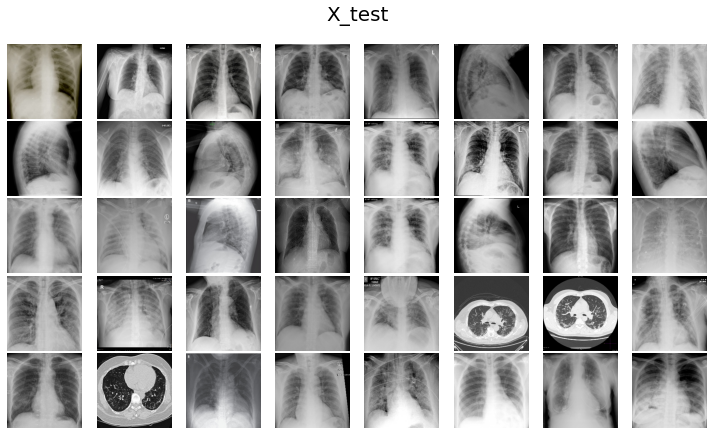

In [ ]:
plot_images(covid_x_train, 'X_train')
plot_images(covid_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

In [ ]:
vggModel = EfficientNetB7(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = vggModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=vggModel.input, outputs=outputs)

for layer in vggModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

In [ ]:
train_aug = ImageDataGenerator(
    rotation_range = 45,
    zoom_range = 0.2,
    shear_range = 0.2,
    featurewise_center = True,
    featurewise_std_normalization = True,
    width_shift_range = 0,
    height_shift_range = 0,
    vertical_flip = False,
    validation_split = 0.2,
    fill_mode = 'nearest'
)

In [ ]:
history = model.fit(train_aug.flow(X_train, y_train, batch_size=10),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 10,
                    steps_per_epoch=len(X_train) / 10,
                    epochs=20)

In [ ]:
model.save('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/EfficientNetB0/EfficientNetB0_chest.h5')
model.save_weights('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/EfficientNetB0/EfficientNetB0_chest.hdf5')

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [ ]:
model = load_model('/content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/EfficientNetB0/EfficientNetB0_chest.h5')

In [ ]:
y_pred = model.predict(X_test, batch_size=batch_size)

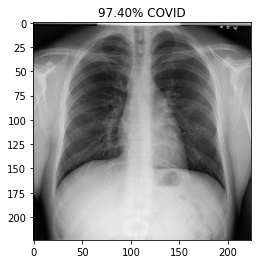

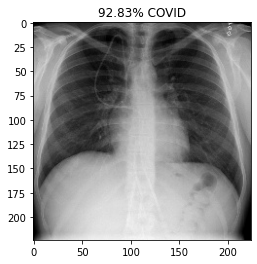

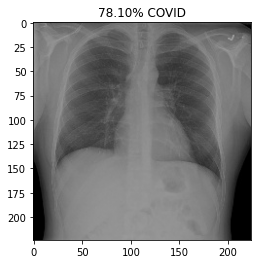

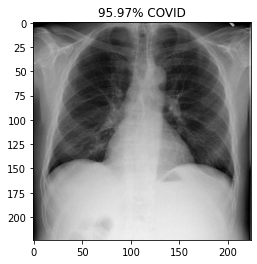

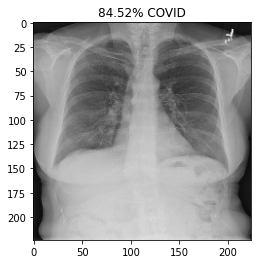

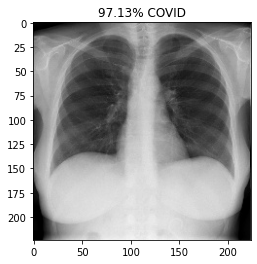

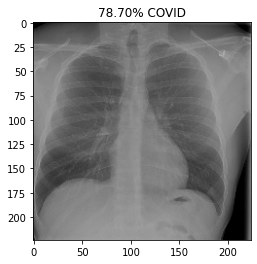

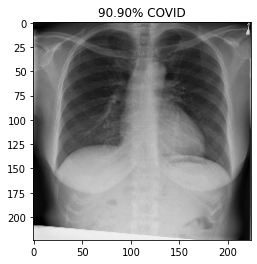

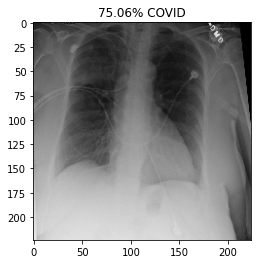

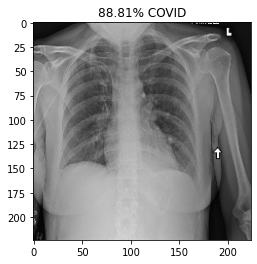

In [ ]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
  if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% COVID')
  else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% NonCOVID')
  plt.imshow(X_test[index])
  plt.show()

In [ ]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

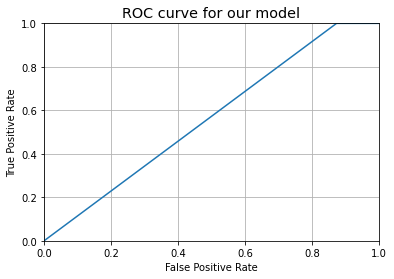

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


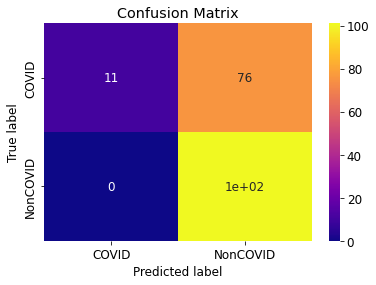

Confusion Matrix with Normalized Values


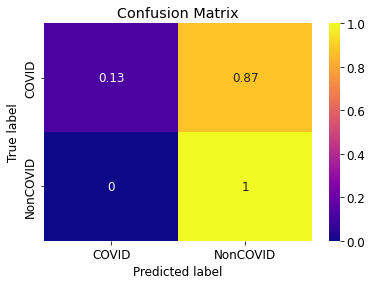

In [ ]:
def plot_confusion_matrix(normalize):
  classes = ['COVID','NonCOVID']
  tick_marks = [0.5,1.5]
  cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
  sns.heatmap(cn,cmap='plasma',annot=True)
  plt.xticks(tick_marks, classes)
  plt.yticks(tick_marks, classes)
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       1.00      0.13      0.22        87
           1       0.57      1.00      0.73       101

    accuracy                           0.60       188
   macro avg       0.79      0.56      0.48       188
weighted avg       0.77      0.60      0.49       188



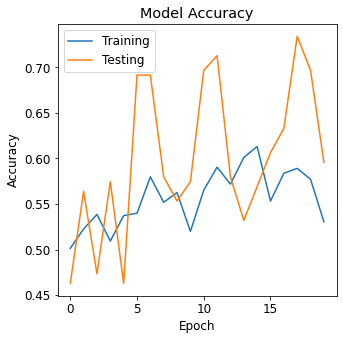

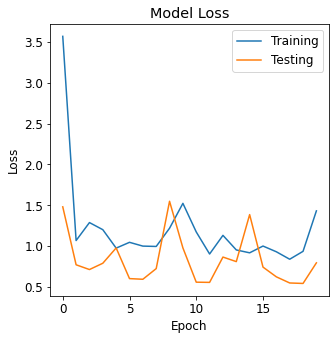

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121_chest_accuracy.png')
plt.show()



plt.figure(figsize=(5,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('//content/drive/MyDrive/Model and weights saved/IEEE 8023 X-ray GIthub/DenseNet121/DenseNet121_chest_loss.png')
plt.show()